In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [7]:
print("Hello Major Project II!")

Hello Major Project II!


In [ ]:
!pip install rasterio
!pip install configilm
!pip install lightning
!pip install lmdb

In [8]:
# Standard lib
import os
import io
import json
import shutil
from collections import defaultdict
from tqdm import tqdm
import warnings

import time
import json
from datetime import datetime

# Data / I/O
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
from rasterio.enums import Resampling
import zstandard as zstd
import tarfile

# PyTorch & helpers
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# ML libs
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score, average_precision_score, f1_score
import numpy as np

# Model libs
import timm
from reben_publication.BigEarthNetv2_0_ImageClassifier import BigEarthNetv2_0_ImageClassifier

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2225: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2225: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [48]:
zst_path = "/kaggle/input/big-earth-net-s2/BigEarthNet-S2.tar.zst"
output_dir = "/kaggle/working/temp"

# Check if folder exists, then remove everything inside
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)  # delete the folder and all its contents
    os.makedirs(output_dir)    # recreate the empty folder
    print(f"✅ Emptied folder: {output_dir}")
else:
    print("⚠️ Folder does not exist.")

# Bands we want to keep
selected_bands = ["B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"]

# Create output folder if not exists
os.makedirs(output_dir, exist_ok=True)

with open(zst_path, 'rb') as f:
    dctx = zstd.ZstdDecompressor()
    with dctx.stream_reader(f) as stream:
        with tarfile.open(fileobj=stream, mode='r|*') as tar:
            count = 0
            top_folders = set()
            for member in tar:
                if member.isfile() and member.name.endswith('.tif'):
                    
                    top_folder = "/".join(member.name.split("/")[:2])
                    top_folders.add(top_folder)
                    
                    if len(top_folders) == 16:
                        break
                        
                    # Check if filename ends with one of the desired bands
                    if any(member.name.endswith(f"_{b}.tif") for b in selected_bands):
                        tar.extract(member, path=output_dir)
                        # count += 1
                # if count >= 1000:  # stop early for testing
                #     break

print(f"✅ Extracted files for selected bands into {output_dir}")


✅ Emptied folder: /kaggle/working/temp
✅ Extracted files for selected bands into /kaggle/working/temp


In [ ]:
# zst_path = "/kaggle/input/big-earth-net-s2/BigEarthNet-S2.tar.zst"


# with open(zst_path, 'rb') as f:
#     dctx = zstd.ZstdDecompressor()
#     with dctx.stream_reader(f) as stream:
#         with tarfile.open(fileobj=stream, mode='r|*') as tar:
#             top_folders = set()
#             for member in tar:
#                 if member.isfile():
#                     top_folder = "/".join(member.name.split("/")[:2])
#                     top_folders.add(top_folder)
#                     # if len(top_folders) == 1:
#                     #     break
#             print(len(top_folders))
# with open("top_folders.txt", "w") as file:
#     for folder in top_folders:
#         file.write(folder + "\n")

In [ ]:
with open("top_folders.txt", "r") as file:
    top_folders = [line.strip() for line in file.readlines()]

print(len(top_folders))


In [8]:
# path = "/kaggle/working/temp/BigEarthNet-S2/S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP/S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57"

# files = sorted(os.listdir(path))  # sorts alphabetically
# for f in files:
#     print(f)


S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B02.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B03.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B04.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B05.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B06.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B07.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B08.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B11.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B12.tif
S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57_B8A.tif


In [7]:
def show_true_color(patch_dir, percentile=99):
    """
    Display a true-color (RGB) image from a BigEarthNet-S2 patch folder.

    Args:
        patch_dir (str): Path to the patch folder containing *_B02.tif, *_B03.tif, *_B04.tif
        percentile (float): Percentile for normalization (default=99)
    """
    rgb_bands = ["B04", "B03", "B02"]  # Red, Green, Blue
    imgs = []

    for band in rgb_bands:
        tif_file = [f for f in os.listdir(patch_dir) if f.endswith(f"_{band}.tif")][0]
        path = os.path.join(patch_dir, tif_file)
        
        with rasterio.open(path) as src:
            # print(src.height, src.width)
            arr = src.read(
                out_shape=(1, src.height, src.width),
                resampling=Resampling.bilinear
            )[0].astype(np.float32)
            imgs.append(arr)

    rgb = np.stack(imgs, axis=-1)
    rgb = rgb / np.percentile(rgb, percentile)  # normalize
    rgb = np.clip(rgb, 0, 1)

    plt.figure(figsize=(6, 6))
    plt.imshow(rgb)
    plt.title(f"True-Color RGB: {os.path.basename(patch_dir)}")
    plt.axis("off")
    plt.show()


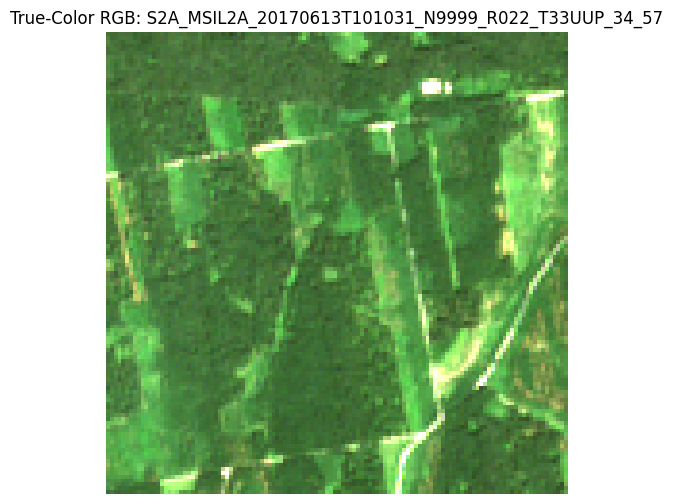

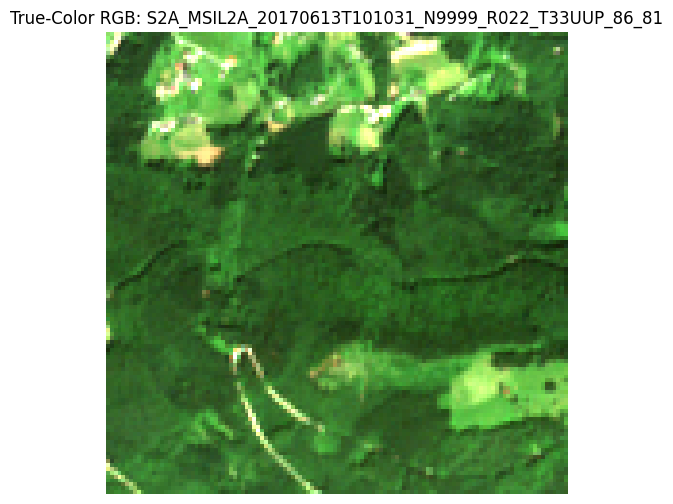

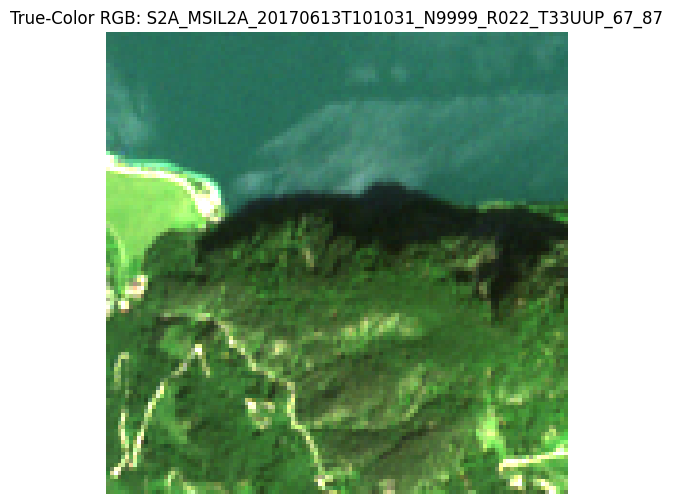

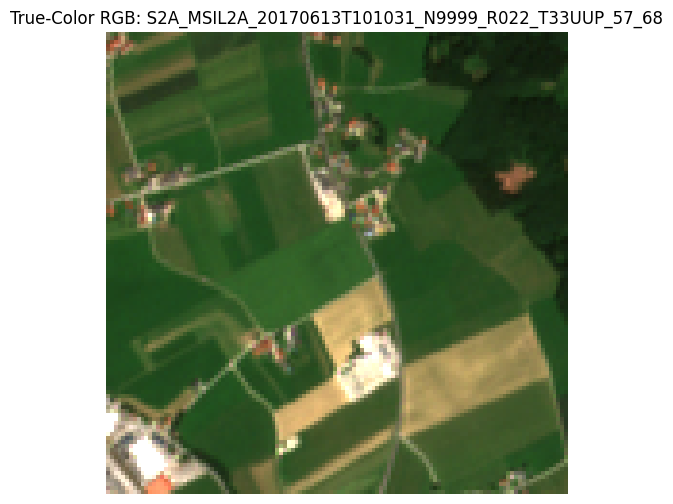

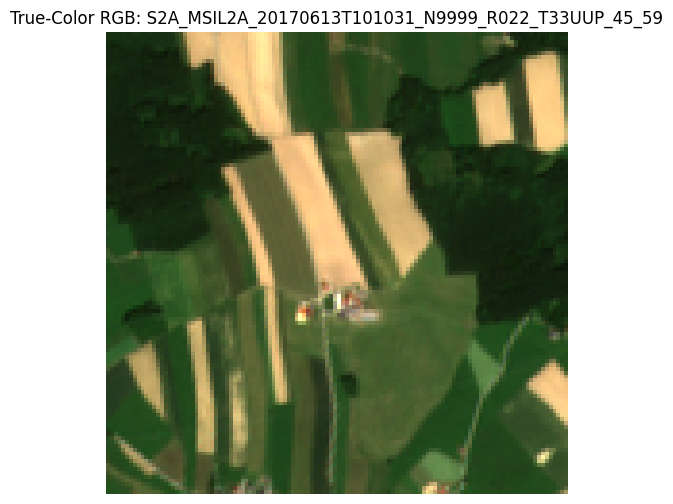

...

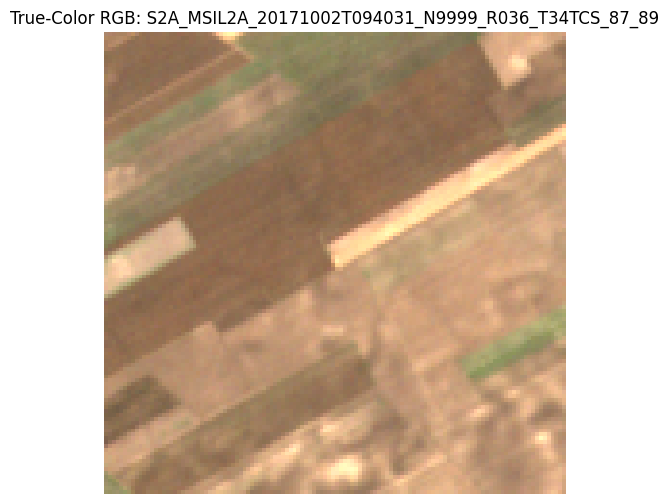

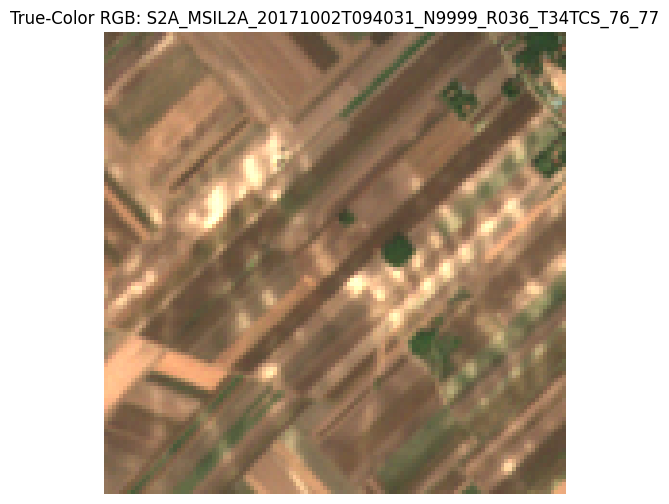

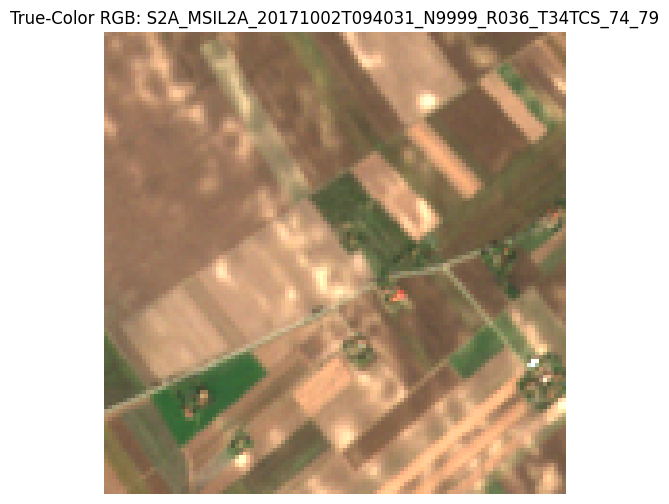

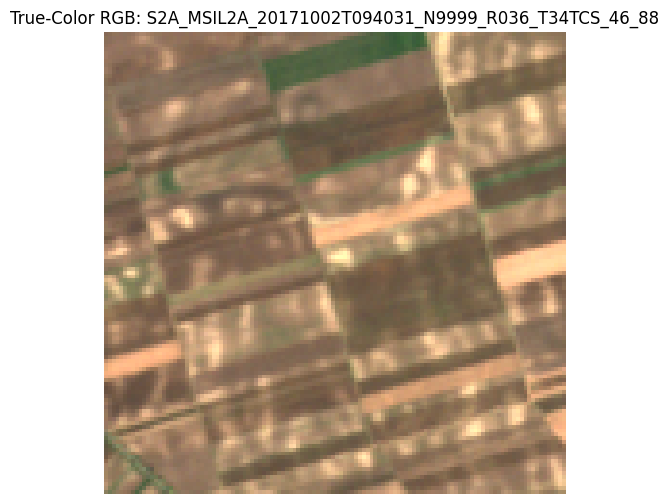

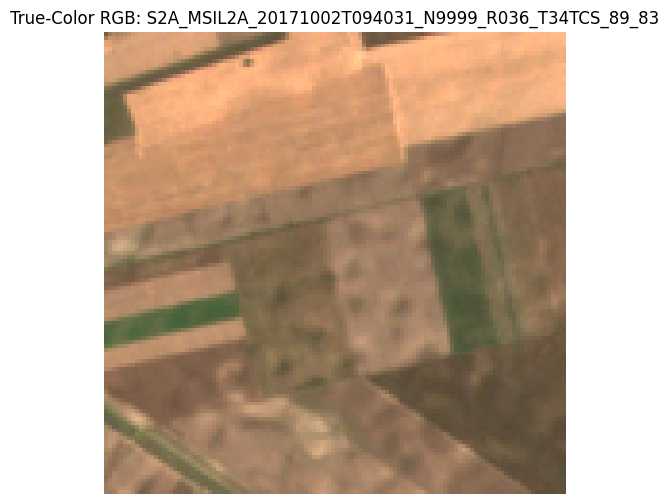

In [8]:
# Base path where all patch folders live
base_dir = "/kaggle/working/temp/BigEarthNet-S2"

# Get all first-level subfolders (patches)
patch_folders = sorted([
    os.path.join(base_dir, f)
    for f in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, f))
])

# Display the first 2 patches for demonstration
for patch_path in patch_folders:
    # Each patch folder may have subfolders
    subfolders = [os.path.join(patch_path, sf) 
                  for sf in os.listdir(patch_path) 
                  if os.path.isdir(os.path.join(patch_path, sf))]

    if not subfolders:
        continue
    
    # Loop through subfolders
    for i in range(10):
        # RGB bands (B04=Red, B03=Green, B02=Blue)
        show_true_color(subfolders[i])

In [2]:
# %cd /kaggle/working
# %mkdir reben_publication
# %cd reben_publication
# !wget "https://git.tu-berlin.de/rsim/reben-training-scripts/-/raw/main/reben_publication/BigEarthNetv2_0_ImageClassifier.py?ref_type=heads"
# !wget "https://zenodo.org/records/10891137/files/metadata.parquet"

/kaggle/working
--2025-10-25 17:15:53--  https://zenodo.org/records/10891137/files/metadata.parquet
Resolving zenodo.org (zenodo.org)... 188.185.43.25, 188.185.45.92, 188.185.48.194, ...
Connecting to zenodo.org (zenodo.org)|188.185.43.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3616349 (3.4M) [application/octet-stream]
Saving to: ‘metadata.parquet’

metadata.parquet    100%[===================>]   3.45M   731KB/s    in 5.0s    

2025-10-25 17:15:58 (712 KB/s) - ‘metadata.parquet’ saved [3616349/3616349]



In [19]:
# # Ensure `labels` is a list
# df["labels"] = df["labels"].apply(lambda x: eval(x) if isinstance(x, str) else x)

# # Encode to a single column of binary lists
# df["encoded"] = df["labels"].apply(
#     lambda lbls: [1 if label in lbls else 0 for label in label_names]
# )

# # Keep only patch_id and encoded column
# encoded_df = df[["patch_id", "encoded"]]

# print(encoded_df.head())

                                             patch_id  \
0  S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_26_57   
1  S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_27_55   
2  S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_27_56   
3  S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_27_57   
4  S2A_MSIL2A_20170613T101031_N9999_R022_T33UUP_27_58   

                                                     encoded  
0  [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0]  
1  [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]  
2  [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]  
3  [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]  
4  [0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]  


In [21]:
# Convert to list of dicts (each row → {"patch_id": ..., "encoded": [...]})
records = encoded_df.to_dict(orient="records")

output_path = "/kaggle/working/bigearthnet_encoded.json"

# Write to JSON file (pretty formatted)
with open(output_path, "w", encoding="utf-8") as f:
    json.dump(records, f, ensure_ascii=False, indent=2)

print(f"✅ Saved JSON to: {output_path}")

✅ Saved JSON to: /kaggle/working/bigearthnet_encoded.json


In [ ]:
# pd.set_option('display.max_columns', None)     # show all columns
# # pd.set_option('display.max_colwidth', None)    # show full cell content (no truncation)
# # pd.set_option('display.width', 0)              # no line wrapping

# path = "/kaggle/working/metadata.parquet"
# df = pd.read_parquet(path)
# print(len(df.columns.tolist()))
# print(df.head())

In [ ]:
df_loaded = pd.read_json("/kaggle/working/bigearthnet_encoded.json")
# print(df_loaded.head())

model = BigEarthNetv2_0_ImageClassifier.from_pretrained(
  "BIFOLD-BigEarthNetv2-0/resnet101-s2-v0.1.1")
label_names = ['Agro-forestry areas', 'Arable land', 'Beaches, dunes, sands', 'Broad-leaved forest', 'Coastal wetlands', 'Complex cultivation patterns', 'Coniferous forest', 'Industrial or commercial units', 'Inland waters', 'Inland wetlands', 'Land principally occupied by agriculture, with significant areas of natural vegetation', 'Marine waters', 'Mixed forest', 'Moors, heathland and sclerophyllous vegetation', 'Natural grassland and sparsely vegetated areas', 'Pastures', 'Permanent crops', 'Transitional woodland, shrub', 'Urban fabric']
# summary(model, input_size=(10, 7, 7))

model.eval()
device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)
# print(model.config

top_dir = "/kaggle/working/temp/BigEarthNet-S2/"
count = 0

for index, row in df_loaded.iterrows():
    if count == 2:
        break
        
    # if index < 90000:
    #     continue
    patch_dir = top_dir+row["patch_id"][:-6]+'/'+row["patch_id"]+'/'
    # print(row["encoded"])
    if os.path.isdir(patch_dir):  # ensure it's a folder
        print(patch_dir)
    else:
        continue
        
    show_true_color(patch_dir)
    band_order = ["B02","B03","B04","B05","B06","B07","B08","B8A","B11","B12"]
    bands = []
    
    # --- use B02 as spatial reference (10 m) ---
    ref_band_path = os.path.join(patch_dir, f"{os.path.basename(row['patch_id'])}_B02.tif")
    with rasterio.open(ref_band_path) as ref:
        ref_profile = ref.profile
        ref_height, ref_width = ref.shape
    
    for band in band_order:
        path = os.path.join(patch_dir, f"{os.path.basename(row['patch_id'])}_{band}.tif")
        with rasterio.open(path) as src:
            # read and resample to match the 10 m reference size
            arr = src.read(
                out_shape=(1, ref_height, ref_width),
                resampling=Resampling.bilinear
            )[0].astype(np.float32)
            arr = np.nan_to_num(arr)
            arr /= np.max(arr) if np.max(arr) > 0 else 1.0
            bands.append(arr)
    
    # stack to (10, H, W)
    img = np.stack(bands)
    
    x = torch.tensor(img).unsqueeze(0)  # (1, 10, H, W)
    # x = torch.nn.functional.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
    print("Image shape:", img.shape)
    x = x.to(device)
    
    with torch.no_grad():
        outputs = model(x)
        logits = outputs.logits if hasattr(outputs, "logits") else outputs
        probs = torch.sigmoid(logits).cpu().numpy()[0]
    
    
    print(probs)

    predicted_labels = [label_names[i] for i, p in enumerate(probs) if p > 0.15]
    print(predicted_labels)
    count += 1

In [9]:
# ============================================================
# 1. Dataset definition with safe folder and band checks
# ============================================================

class BigEarthNetCustomDataset(Dataset):
    def __init__(self, df, root_dir, transform=None):
        """
        Args:
            df: Pandas DataFrame with 'patch_id' and 'encoded' columns
            root_dir: path to BigEarthNet-S2 root
            transform: optional transforms for torch tensors
        """
        self.df = df
        self.root_dir = root_dir
        self.transform = transform
        self.band_order = [
            "B02", "B03", "B04", "B05", "B06",
            "B07", "B08", "B8A", "B11", "B12"
        ]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        patch_dir = os.path.join(self.root_dir, row["patch_id"][:-6], row["patch_id"])

        try:
            # --- check patch folder ---
            if not os.path.isdir(patch_dir):
                raise FileNotFoundError(f"Missing folder: {patch_dir}")

            # --- reference band (B02) ---
            ref_band_path = os.path.join(patch_dir, f"{row['patch_id']}_B02.tif")
            if not os.path.exists(ref_band_path):
                raise FileNotFoundError(f"Missing reference band: {ref_band_path}")

            with rasterio.open(ref_band_path) as ref:
                ref_height, ref_width = ref.shape

            # --- read and normalize all bands ---
            bands = []
            for band in self.band_order:
                path = os.path.join(patch_dir, f"{row['patch_id']}_{band}.tif")
                if not os.path.exists(path):
                    raise FileNotFoundError(f"Missing band: {path}")

                with rasterio.open(path) as src:
                    arr = src.read(
                        out_shape=(1, ref_height, ref_width),
                        resampling=Resampling.bilinear
                    )[0].astype(np.float32)
                    arr = np.nan_to_num(arr)
                    arr /= np.max(arr) if np.max(arr) > 0 else 1.0
                    bands.append(arr)

            img = np.stack(bands, axis=0)  # shape: (10, H, W)
            img = torch.tensor(img, dtype=torch.float32)
            label = torch.tensor(row["encoded"], dtype=torch.float32)

            if self.transform:
                img = self.transform(img)

            return img, label

        except Exception as e:
            print(f"⚠️ Skipping {row['patch_id']}: {e}")
            return None


# ============================================================
# 2. Collate function (skips None safely)
# ============================================================

def safe_collate_fn(batch):
    """Skips None samples (missing or broken patches)."""
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None
    return torch.utils.data.default_collate(batch)

In [49]:
# folder_count = 0

# top_dir = "/kaggle/working/temp/BigEarthNet-S2/"
# for index, row in df.iterrows():
#     folder_count += 1
#     # if index < 90000:
#     #     continue
#     patch_dir = top_dir+row["patch_id"][:-6]+'/'+row["patch_id"]+'/'
#     # print(patch_dir)
#     if not os.path.isdir(patch_dir):  # ensure it's a folder
#         break

# print("Folder Count:", folder_count)

Folder Count: 73768


In [10]:
# ============================================================
# 3. Build ResNet-152 model for 10-band input, 19 classes
# ============================================================

def build_resnet152(num_classes=19, in_channels=10, pretrained=True):
    model = timm.create_model(
        "resnet152",
        pretrained=pretrained,
        in_chans=in_channels,
        num_classes=num_classes
    )
    return model


# ============================================================
# 4. Load and split dataset
# ============================================================

df = pd.read_json("/kaggle/working/bigearthnet_encoded.json")

train_df, test_df = train_test_split(df[:73760], test_size=0.15, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.15, random_state=42)

print(f"Train size: {len(train_df)}; Val size: {len(val_df)}; Test size: {len(test_df)}; " )
root_dir = "/kaggle/working/temp/BigEarthNet-S2"

train_dataset = BigEarthNetCustomDataset(train_df, root_dir)
val_dataset = BigEarthNetCustomDataset(val_df, root_dir)
test_dataset = BigEarthNetCustomDataset(test_df, root_dir)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2, collate_fn=safe_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2, collate_fn=safe_collate_fn)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2, collate_fn=safe_collate_fn)


# ============================================================
# 5. Setup model, optimizer, scheduler
# ============================================================

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device: ", device)

model = build_resnet152().to(device)
print("Model loaded")
criterion = nn.BCEWithLogitsLoss()  # Multi-label classification
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

Train size: 53291; Val size: 9405; Test size: 11064; 
Device:  cuda


model.safetensors:   0%|          | 0.00/241M [00:00<?, ?B/s]

Model loaded


In [11]:
# ============================================================
# 6. Training and evaluation functions
# ============================================================

def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for batch in tqdm(dataloader, desc="Training", leave=False):
        if batch is None:
            continue
        imgs, labels = batch
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * imgs.size(0)

    return running_loss / len(dataloader.dataset)

def compute_metrics(y_true, y_pred, threshold=0.5):
    """
    y_true, y_pred: numpy arrays of shape (N, C)
    threshold: cutoff for binarizing predictions
    """
    # binarize
    y_pred_bin = (y_pred >= threshold).astype(int)

    # --- F1 metrics ---
    f1m = f1_score(y_true, y_pred_bin, average="micro")
    f1u = f1_score(y_true, y_pred_bin, average="macro")

    # --- Average Precision metrics ---
    # Note: average_precision_score expects raw probabilities (not thresholded)
    apm = average_precision_score(y_true, y_pred, average="micro")
    apu = average_precision_score(y_true, y_pred, average="macro")

    return {
        "F1m": f1m,
        "F1u": f1u,
        "APm": apm,
        "APu": apu
    }

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False):
            if batch is None:
                continue
            imgs, labels = batch
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * imgs.size(0)

            preds = torch.sigmoid(outputs)
            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # Stack all predictions and ground truth
    y_true = np.vstack(all_labels)
    y_pred = np.vstack(all_preds)
    y_pred_bin = (y_pred >= 0.5).astype(int)

    # --- Classic multi-label metrics ---
    micro_f1 = f1_score(y_true, y_pred_bin, average="micro", zero_division=0)
    macro_f1 = f1_score(y_true, y_pred_bin, average="macro", zero_division=0)
    micro_prec = precision_score(y_true, y_pred_bin, average="micro", zero_division=0)
    micro_rec = recall_score(y_true, y_pred_bin, average="micro", zero_division=0)

    # --- Average Precision metrics ---
    try:
        ap_micro = average_precision_score(y_true, y_pred, average="micro")
        ap_macro = average_precision_score(y_true, y_pred, average="macro")
    except ValueError:
        # Handle rare edge cases (e.g. if a class has no positive labels)
        ap_micro, ap_macro = np.nan, np.nan

    return (
        total_loss / len(dataloader.dataset),  # average loss
        micro_f1, macro_f1,
        micro_prec, micro_rec,
        ap_micro, ap_macro,
        y_true, y_pred
    )

def compute_auroc(y_true, y_pred):
    """Compute per-class and mean AUROC safely."""
    n_classes = y_true.shape[1]
    auroc_per_class = []

    for i in range(n_classes):
        try:
            score = roc_auc_score(y_true[:, i], y_pred[:, i])
        except ValueError:
            score = np.nan  # occurs if only one class (all 0s or all 1s)
        auroc_per_class.append(score)

    mean_auroc = np.nanmean(auroc_per_class)
    return mean_auroc, auroc_per_class

def plot_confusion_per_class(y_true, y_pred_bin, label_names):
    """
    Plot a separate confusion matrix for each class (multi-label setup).
    """
    n_classes = len(label_names)

    for i, label in enumerate(label_names):
        cm = confusion_matrix(y_true[:, i], y_pred_bin[:, i])

        # handle single-class case gracefully
        if cm.shape == (1, 1):
            cm = np.array([[cm[0, 0], 0], [0, 0]])

        plt.figure(figsize=(4, 4))
        sns.heatmap(
            cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            cbar=False,
            square=True,
            xticklabels=['Pred 0', 'Pred 1'],
            yticklabels=['True 0', 'True 1']
        )
        plt.title(f"Confusion Matrix — {label}", fontsize=12, fontweight='bold')
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.tight_layout()
        plt.show()

In [52]:
!rm best_resnet152.pth

In [ ]:
# ============================================================
# 7. Main training loop
# ============================================================
warnings.filterwarnings("ignore", message="No positive class found")

best_val_f1 = 0.0
num_epochs = 25  # Increase as needed

# --- Setup ---
checkpoint_path = "/kaggle/working/best_resnet152.pth"
log_dir = "/kaggle/working/training_logs"
os.makedirs(log_dir, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
log_path = os.path.join(log_dir, f"train_log_{timestamp}.json")

best_val_f1 = 0.0
start_epoch = 0
history = []

train_losses, val_losses = [], []
val_micro_f1s, val_macro_f1s = [], []

# --- Resume from checkpoint if it exists ---
if os.path.exists(checkpoint_path):
    print(f"🔁 Loading checkpoint from {checkpoint_path}")
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    best_val_f1 = checkpoint["best_val_f1"]
    start_epoch = checkpoint["epoch"] + 1
    print(f"Resuming from epoch {start_epoch}, best F1: {best_val_f1:.4f}")

# --- Training loop ---
for epoch in range(start_epoch, num_epochs):
    print(f"\n🌍 Epoch {epoch+1}/{num_epochs}")

    start_time = time.time()
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, f1u, f1m, prec, rec, apu, apm, _ , _ = evaluate_model(
    model, val_loader, criterion, device
    )
    scheduler.step()
    epoch_time = time.time() - start_time

    # --- Store metrics ---
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_micro_f1s.append(f1m)
    val_macro_f1s.append(f1u)

    print(f"⏱️ Epoch time: {epoch_time:.2f}s")
    print(f"Val Loss: {val_loss:.4f}")
    print(f"F1m: {f1m:.4f} | F1u: {f1u:.4f}")
    print(f"Precision: {prec:.4f} | Recall: {rec:.4f}")
    print(f"APm: {apm:.4f} | APu: {apu:.4f}")
    
    # --- Save best model ---
    if f1u > best_val_f1:
        best_val_f1 = f1u
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "best_val_f1": best_val_f1
        }, checkpoint_path)
        print(f"✅ Saved new best model (F1={best_val_f1:.4f})")

    # --- Log stats for this epoch ---
    epoch_log = {
    "epoch": epoch + 1,
    "train_loss": train_loss,
    "val_loss": val_loss,
    "f1m": f1m,
    "f1u": f1u,
    "precision": prec,
    "recall": rec,
    "APm": apm,
    "APu": apu,
    "epoch_time_sec": epoch_time,
    "best_val_f1": best_val_f1
}
    history.append(epoch_log)

    # Save running logs after each epoch (safe even if runtime stops)
    with open(log_path, "w") as f:
        json.dump(history, f, indent=4)

print(f"\n📁 Training finished. Logs saved to: {log_path}")
print(f"🏆 Best Val Micro-F1: {best_val_f1:.4f}")


🌍 Epoch 1/25


Training:  70%|███████   | 2347/3331 [10:03<04:29,  3.65it/s]

In [12]:
epochs = range(1, len(train_losses) + 1)

# === Training vs Validation Loss ===
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# === Validation F1 Scores ===
plt.figure(figsize=(8, 5))
plt.plot(epochs, val_micro_f1s, label='Validation Micro F1')
plt.plot(epochs, val_macro_f1s, label='Validation Macro F1', linestyle='--')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.title('Validation F1 Scores')
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'train_losses' is not defined

In [13]:
# ============================================================
# 8. Final test evaluation
# ============================================================

print("\n🧪 Evaluating on Test Set...")

# Load best model safely
checkpoint = torch.load("/kaggle/working/best_resnet152.pth", weights_only=False)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device)

# Evaluate model on test set
test_loss, f1m, f1u, prec, rec, apu, apm, y_true, y_pred = evaluate_model(
    model, test_loader, criterion, device
)

# Compute AUROC (per-class + mean)
mean_auroc, auroc_per_class = compute_auroc(y_true, y_pred)

# ---- Print summary ----
print(f"\n📊 Test Results ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print(f"Test Loss: {test_loss:.4f}")
print(f"F1m: {f1m:.4f} | F1u: {f1u:.4f}")
print(f"Precision: {prec:.4f} | Recall: {rec:.4f}")
print(f"APm: {apm:.4f} | APu: {apu:.4f}")
print(f"Mean AUROC: {mean_auroc:.4f}")

label_names = ['Agro-forestry areas', 'Arable land', 'Beaches, dunes, sands', 'Broad-leaved forest', 'Coastal wetlands', 'Complex cultivation patterns', 'Coniferous forest', 'Industrial or commercial units', 'Inland waters', 'Inland wetlands', 'Land principally occupied by agriculture, with significant areas of natural vegetation', 'Marine waters', 'Mixed forest', 'Moors, heathland and sclerophyllous vegetation', 'Natural grassland and sparsely vegetated areas', 'Pastures', 'Permanent crops', 'Transitional woodland, shrub', 'Urban fabric']

# Optional: Print per-class AUROC for debugging / analysis
print("\nPer-Class AUROC:")
for i, score in enumerate(auroc_per_class):
    print(f"{label_names[i]}: {score:.4f}" if not np.isnan(score) else f"{label_names[i]}:  NaN")


🧪 Evaluating on Test Set...



📊 Test Results (2025-11-02 10:50:04)
Test Loss: 0.1793
F1m: 0.7611 | F1u: 0.6735
Precision: 0.7954 | Recall: 0.7297
APm: 0.7366 | APu: 0.8573
Mean AUROC: 0.9474

Per-Class AUROC:
Agro-forestry areas: 0.9879
Arable land: 0.9565
Beaches, dunes, sands: 0.9981
Broad-leaved forest: 0.9156
Coastal wetlands: 0.9664
Complex cultivation patterns: 0.8948
Coniferous forest: 0.9577
Industrial or commercial units: 0.9401
Inland waters: 0.9732
Inland wetlands: 0.9477
Land principally occupied by agriculture, with significant areas of natural vegetation: 0.8850
Marine waters: 0.9985
Mixed forest: 0.9408
Moors, heathland and sclerophyllous vegetation: 0.9718
Natural grassland and sparsely vegetated areas: 0.9192
Pastures: 0.9613
Permanent crops: 0.9557
Transitional woodland, shrub: 0.8726
Urban fabric: 0.9582


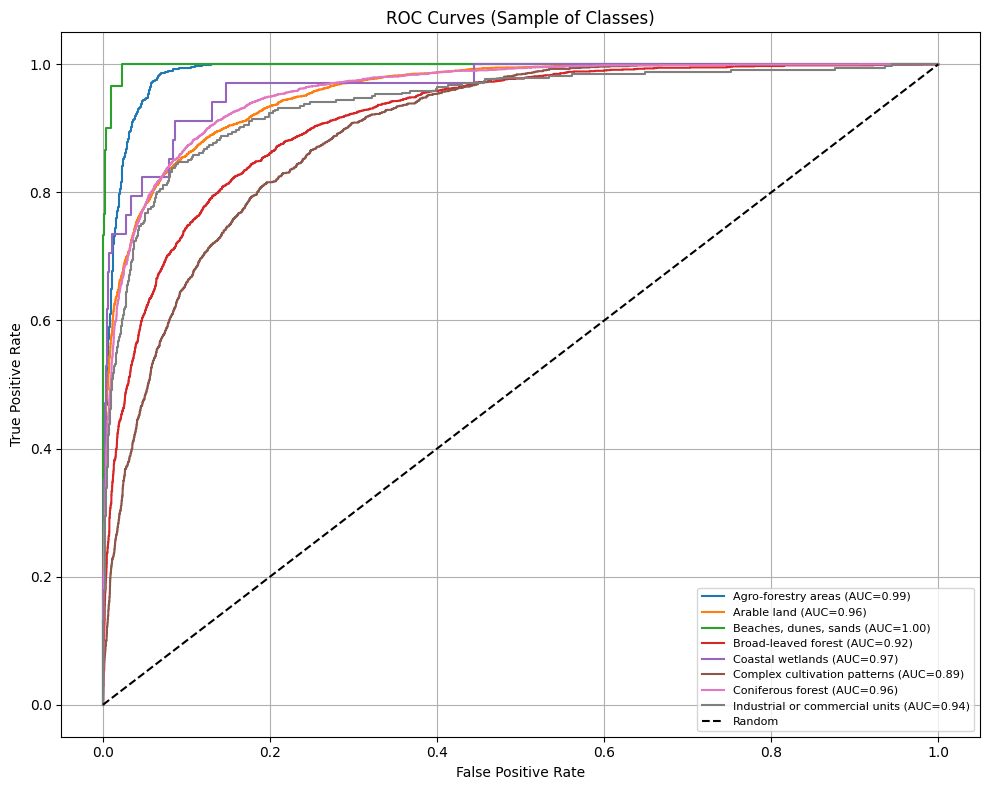

✅ Saved ROC curves in: /kaggle/working/roc_curves


In [14]:
def plot_per_class_roc(y_true, y_pred, label_names, output_dir="/kaggle/working/roc_curves", max_classes_to_plot=8):
    os.makedirs(output_dir, exist_ok=True)
    n_classes = y_true.shape[1]

    # Plot selected classes in one figure
    plt.figure(figsize=(10, 8))
    plotted = 0

    for i in range(n_classes):
        try:
            fpr, tpr, _ = roc_curve(y_true[:, i], y_pred[:, i])
            auc_val = roc_auc_score(y_true[:, i], y_pred[:, i])
        except ValueError:
            continue  # Skip classes with no positive labels

        if np.isnan(auc_val):
            continue

        if plotted < max_classes_to_plot:
            plt.plot(fpr, tpr, label=f"{label_names[i]} (AUC={auc_val:.2f})")
            plotted += 1

        # Save each ROC curve individually
        plt.figure(figsize=(6, 5))
        plt.plot(fpr, tpr, label=f"AUC = {auc_val:.3f}")
        plt.plot([0, 1], [0, 1], "k--")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve — {label_names[i]}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f"roc_{label_names[i].replace(' ', '_')}.png"))
        plt.close()

    # Combined figure for top classes
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves (Sample of Classes)")
    plt.legend(fontsize=8)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "roc_combined.png"))
    plt.show()

    print(f"✅ Saved ROC curves in: {output_dir}")
plot_per_class_roc(y_true, y_pred, label_names)


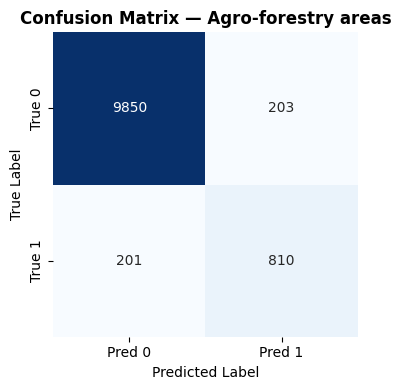

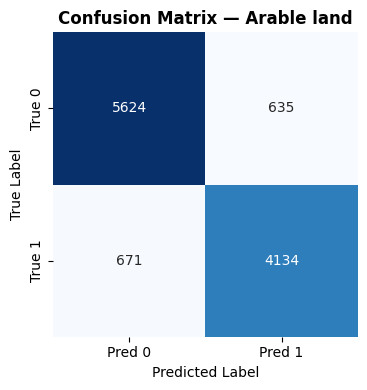

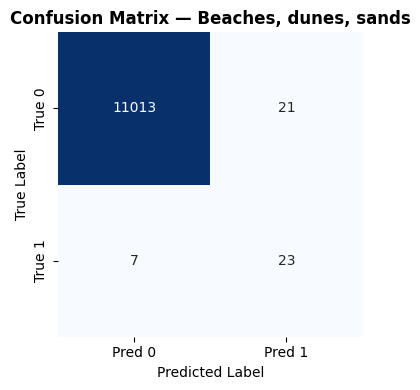

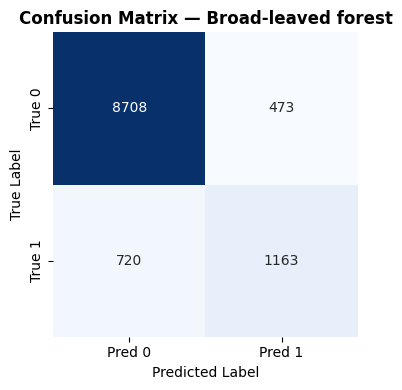

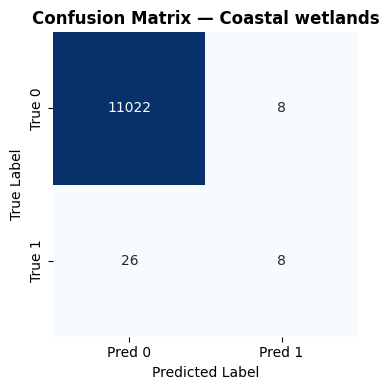

...

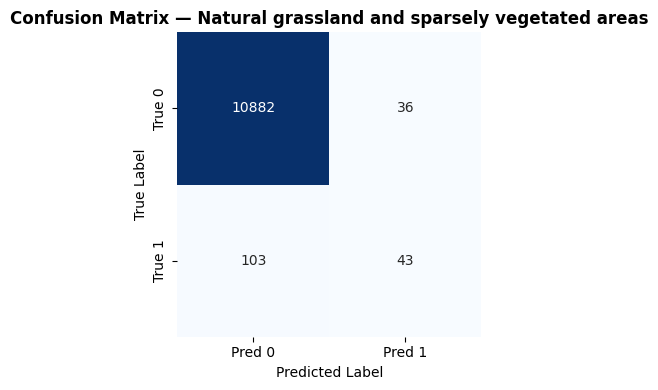

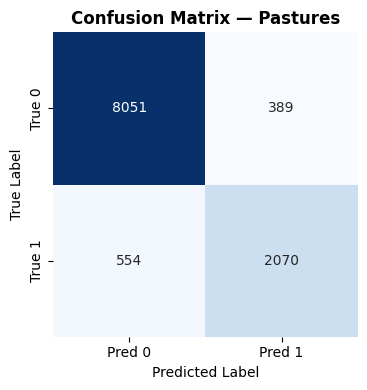

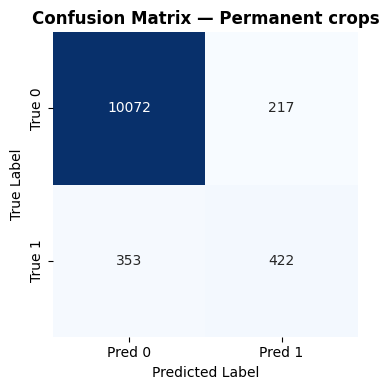

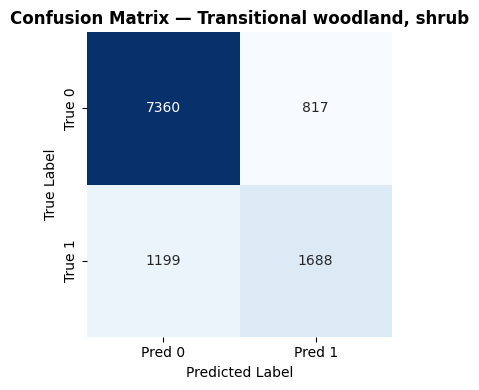

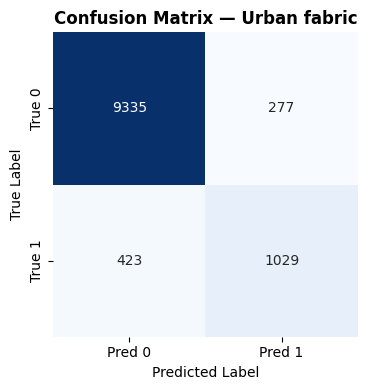

In [15]:
y_pred_bin = (y_pred >= 0.5).astype(int)
plot_confusion_per_class(y_true, y_pred_bin, label_names)